### remember to change model saving path!!!

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import os
from torchvision import transforms
import pandas as pd
import matplotlib.pyplot as plt
import torch.optim as optim

from tqdm import tqdm
import random
import torch.nn as nn
from dataset import Thyroid_Dataset
from model import Eff_Unet
from HarDMSEG import HarDMSEG
from loss_metric import DiceLoss, IOU_score, StructureLoss, TverskyLoss
from LightMed.model.LightMed import LightMed
from PMFSNet.lib.models.PMFSNet import PMFSNet
from PMFSNet.lib.models.PMFSNet_FFT import PMFSNet_FFT
from hybrid_model_v3 import HybridSegModel
from helper import postprocess_logits_with_fill

In [ ]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import os
from torchvision import transforms
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms.functional as tx
import random
import cv2
from PIL import ImageEnhance
from skimage.exposure import match_histograms
import torchvision.transforms as T
import torchvision.transforms.functional as F
class Ge_Benq_Dataset(Dataset):
    def __init__(self, csv_file, transform, image_size, training = True, allow_zero_mask = False):
        self.df = pd.read_csv(csv_file)
        self.transform = transform
        self.image_size = image_size
        self.training = training
        self.allow_zero_mask = allow_zero_mask
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_name = self.df["image_name"][idx]
        mask_name = self.df["mask_name"][idx]
        dataset = self.df["dataset"][idx]
        mask_type = self.df["mask_type"][idx]
        
        if dataset == "ge":
            from_dataset = 1
        elif dataset == "benq":
            from_dataset = 2

        if mask_type == "nodule":
            mask_type = 1
        elif mask_type == "gland":
            mask_type = 2
        
            
        if dataset == "benq":
            from_folder = "../gland_data/"
        elif dataset == "ge":
            if mask_type == 1:
                from_folder = "../ge_data/nodule"
            else:
                from_folder = "../ge_data/gland"
        
        image_path = f"{from_folder}/images/{image_name}"
        mask_path = f"{from_folder}/masks/{mask_name}"

        image = Image.open(image_path).convert("L")
        mask = Image.open(mask_path).convert("L")
        
        image_tensor, mask_tensor = self.transform(image, mask, self.image_size)
        mask_tensor = (mask_tensor > 0.5).float()
        if torch.sum(mask_tensor) == 0 and self.allow_zero_mask == False:
            # print("nothing")
            return [None]
        return image_tensor, mask_tensor, from_dataset, mask_type, mask_name

In [53]:
image_size = 128
batch_size = 1
def test_augmentation(image, mask, image_size):
    resize = T.Resize((image_size, image_size))
    image = resize(image)
    mask = resize(mask)

    image_tensor = tx.to_tensor(image)
    mask_tensor = tx.to_tensor(mask)

    # If standardization
    mean = image_tensor.mean()
    std = image_tensor.std()
    std = std if std > 0 else 1.0  # avoid division by zero
    image_tensor = (image_tensor - mean) / std
    return image_tensor, mask_tensor
def custom_collate_fn(batch):
    # print(batch)
    filtered_batch = [item for item in batch if item[0] is not None]
    if len(filtered_batch) == 0:
        return [None, None, None, None, None]
    return torch.utils.data.dataloader.default_collate(filtered_batch)
test_path = "../ge_benq_data/ge(nodule_gland)_benq(gland)_test_add_inference_v1.csv"
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)

image, mask, from_dataset, mask_type, mask_name = next(iter(test_dataloader))

In [54]:
from_dataset[0]

tensor(2)

In [55]:
len(test_dataset)

229

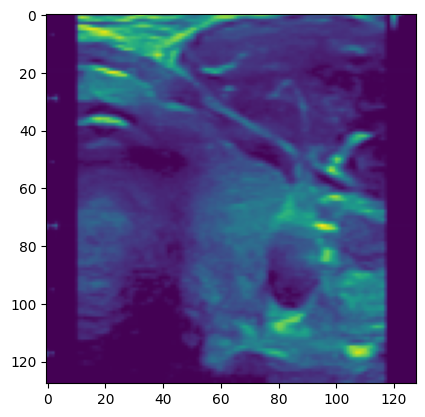

In [56]:
plt.imshow(image[0][0])

In [57]:
import torch
import numpy as np
import cv2

# Only calculate nodule loss, IOU, DICE, because there is no gland data in the testing set
def val_v1(dataloader, model, device):
    total_loss = 0
    total_IOU = 0
    total_DICE = 0

    ge_nodule_IOU = 0
    ge_gland_IOU = 0
    benq_gland_IOU = 0

    ge_nodule_DICE = 0
    ge_gland_DICE = 0
    benq_gland_DICE = 0

    ge_nodule_count = 0
    ge_gland_count = 0
    benq_gland_count = 0
    
    model.eval()
    model.to(device)

    for image, mask, from_dataset, mask_type, mask_name in tqdm(dataloader):
        if image == None:
            continue
            
        image, mask = image.to(device), mask.to(device)
        
        outputs = model(image)
        nodule_output = outputs[:, 0:1, :, :]
        gland_output = outputs[:, 1:2, :, :]

        ge_nodule_output = nodule_output[(from_dataset == 1) & (mask_type == 1)]
        ge_gland_output = gland_output[(from_dataset == 1) & (mask_type == 2)]
        benq_gland_output = gland_output[(from_dataset == 2) & (mask_type == 2)]

        ge_nodule_mask = mask[(from_dataset == 1) & (mask_type == 1)]
        ge_gland_mask =mask[(from_dataset == 1) & (mask_type == 2)]
        benq_gland_mask =mask[(from_dataset == 2) & (mask_type == 2)]
        
        if from_dataset[0] == 1 and mask_type[0] == 1:
            IOU = IOU_score(ge_nodule_output, ge_nodule_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)

            ge_nodule_IOU += IOU.item()
            ge_nodule_DICE += DICE.item()
            ge_nodule_count += 1
        elif from_dataset[0] == 1 and mask_type[0] == 2:
            IOU = IOU_score(ge_gland_output, ge_gland_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)

            ge_gland_IOU += IOU.item()
            ge_gland_DICE += DICE.item()
            ge_gland_count += 1
        elif from_dataset[0] == 2 and mask_type[0] == 2:
            IOU = IOU_score(benq_gland_output, benq_gland_mask)
            dice_loss = DiceLoss()
            DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)

            benq_gland_IOU += IOU.item()
            benq_gland_DICE += DICE.item()
            benq_gland_count += 1
       

    print("ge nodule count : ", ge_nodule_count)
    return ge_nodule_IOU / ge_nodule_count, ge_gland_IOU / ge_gland_count, benq_gland_IOU / benq_gland_count, ge_nodule_DICE / ge_nodule_count, ge_gland_DICE / ge_gland_count, benq_gland_DICE / benq_gland_count

def val_v2(dataloader, model, device, gland_post_process = False, nodule_post_process = False):
    total_loss = 0
    total_IOU = 0
    total_DICE = 0

    ge_nodule_IOU = 0
    ge_gland_IOU = 0
    benq_gland_IOU = 0

    ge_nodule_DICE = 0
    ge_gland_DICE = 0
    benq_gland_DICE = 0

    ge_nodule_count = 0
    ge_gland_count = 0
    benq_gland_count = 0
    
    model.eval()
    model.to(device)

    for image, mask, from_dataset, mask_type, mask_name in tqdm(dataloader):
        if image == None:
            continue
            
        image, mask = image.to(device), mask.to(device)
        
        outputs = model(image)
        nodule_output = outputs[:, 0:1, :, :]
        gland_output = outputs[:, 1:2, :, :]

        ge_nodule_output = nodule_output
        ge_gland_output = gland_output
        benq_gland_output = gland_output

        ge_nodule_mask = mask
        ge_gland_mask = mask
        benq_gland_mask = mask

        if gland_post_process:
            ge_gland_output = postprocess_logits_with_fill(ge_gland_output)
            benq_gland_output = postprocess_logits_with_fill(benq_gland_output)
        if nodule_post_process:
            ge_nodule_output = postprocess_logits_with_fill(ge_nodule_output)
            # ge_nodule_output = torch.sigmoid(ge_nodule_output)
            # ge_nodule_output = ge_nodule_output > 0.5
            # ge_nodule_output = ge_nodule_output * ge_gland_output
        
        if from_dataset[0] == 1 and mask_type[0] == 1:
            if nodule_post_process:
                IOU = IOU_score(ge_nodule_output, ge_nodule_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)
            else:
                IOU = IOU_score(ge_nodule_output, ge_nodule_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(ge_nodule_output, ge_nodule_mask)

            ge_nodule_IOU += IOU.item()
            ge_nodule_DICE += DICE.item()
            ge_nodule_count += 1
        elif from_dataset[0] == 1 and mask_type[0] == 2:
            if gland_post_process:
                IOU = IOU_score(ge_gland_output, ge_gland_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)
            else:
                IOU = IOU_score(ge_gland_output, ge_gland_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(ge_gland_output, ge_gland_mask)

            ge_gland_IOU += IOU.item()
            ge_gland_DICE += DICE.item()
            ge_gland_count += 1
        elif from_dataset[0] == 2 and mask_type[0] == 2:
            if gland_post_process:
                IOU = IOU_score(benq_gland_output, benq_gland_mask, need_act = False)
                dice_loss = DiceLoss(need_act = False)
                DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)
            else:
                IOU = IOU_score(benq_gland_output, benq_gland_mask)
                dice_loss = DiceLoss()
                DICE = 1 - dice_loss(benq_gland_output, benq_gland_mask)

            benq_gland_IOU += IOU.item()
            benq_gland_DICE += DICE.item()
            benq_gland_count += 1
       
    print("ge nodule count : ", ge_nodule_count)

    return ge_nodule_IOU / ge_nodule_count, ge_gland_IOU / ge_gland_count, benq_gland_IOU / benq_gland_count, ge_nodule_DICE / ge_nodule_count, ge_gland_DICE / ge_gland_count, benq_gland_DICE / benq_gland_count

    

In [69]:

# inference_name = "hybrid_model_ge(nodule_gland)_benq(gland)_from_scratch_v1_aug_space(0.9)"
# model = HybridSegModel(in_channels = 1, out_channels = 2, output_size = image_size, layers_num = 3)
# checkpoint = torch.load(f"models/from_scratch/ge_benq/{inference_name}/best_checkpoint.pth")
# model.load_state_dict(checkpoint['model_state_dict'])
inference_name = "hybrid_model_ge(nodule_gland_inference)_benq(gland)_from_scratch_v3_2_aug_space(0.9)_weight_decay(1e-4)"
model = HybridSegModel(in_channels = 1, out_channels = 2, output_size = image_size, layers_num = 3)
checkpoint = torch.load(f"models/from_scratch/ge_benq_inference/{inference_name}/best_checkpoint.pth")
model.load_state_dict(checkpoint['model_state_dict'])



<All keys matched successfully>

In [70]:
ge_nodule_IOU, ge_gland_IOU, benq_gland_IOU, ge_nodule_DICE, ge_gland_DICE, benq_gland_DICE = val_v1(test_dataloader, model, "cuda")
print(f"ge nodule IOU : {ge_nodule_IOU}, ge nodule DICE : {ge_nodule_DICE}")
print(f"ge gland IOU : {ge_gland_IOU}, ge gland DICE : {ge_gland_DICE}")
print(f"benq gland IOU : {benq_gland_IOU}, ge gland DICE : {benq_gland_DICE}")


100%|██████████| 229/229 [00:04<00:00, 47.66it/s]

ge nodule count :  101
ge nodule IOU : 0.7704414448524847, ge nodule DICE : 0.8504450663481609
ge gland IOU : 0.7980761418217107, ge gland DICE : 0.8742940284703907
benq gland IOU : 0.7251943031610069, ge gland DICE : 0.8231678857641705


In [71]:
ge_nodule_IOU, ge_gland_IOU, benq_gland_IOU, ge_nodule_DICE, ge_gland_DICE, benq_gland_DICE = val_v2(test_dataloader, model, "cuda", gland_post_process = True, nodule_post_process = True)
print(f"ge nodule IOU : {ge_nodule_IOU}, ge nodule DICE : {ge_nodule_DICE}")
print(f"ge gland IOU : {ge_gland_IOU}, ge gland DICE : {ge_gland_DICE}")
print(f"benq gland IOU : {benq_gland_IOU}, ge gland DICE : {benq_gland_DICE}")


100%|██████████| 229/229 [00:05<00:00, 39.47it/s]

ge nodule count :  101
ge nodule IOU : 0.7763039753577877, ge nodule DICE : 0.8619386252790394
ge gland IOU : 0.8017780561196176, ge gland DICE : 0.8881907086623343
benq gland IOU : 0.7477247169462301, ge gland DICE : 0.8521937263213982


In [ ]:
test_path = "../ge_benq_data/ge(nodule_gland)_benq(gland)_test.csv"

# visualize ge nodule non-zero mask

In [72]:
from torchvision.transforms.functional import to_pil_image

def overlay(image, mask):
    image_rgb = image.repeat(3, 1, 1)  # shape: [3, H, W]

    # Create red overlay where mask == 1
    # (Red channel = 1, Green = 0, Blue = 0)
    red = torch.tensor([1.0, 0.0, 0.0]).view(3, 1, 1)
    color_mask = mask * red  # shape: [3, H, W]
    
    # Blend mask onto image
    alpha = 0.8  # transparency
    overlay = (1 - alpha) * image_rgb + alpha * color_mask
    return overlay

  0%|          | 0/229 [00:00<?, ?it/s]

name :  video_000058_1729844840454.mp4#t=0.8.png


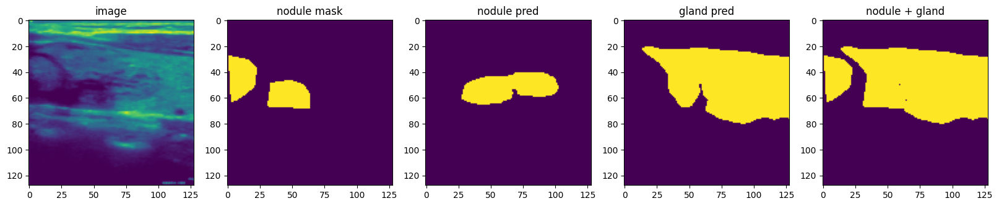

  1%|▏         | 3/229 [00:00<01:12,  3.11it/s]

name :  video_000055_1729840338149.mp4#t=7.4.png


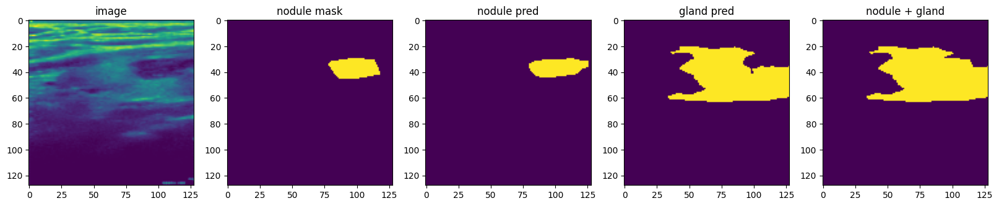

  2%|▏         | 4/229 [00:02<02:29,  1.51it/s]

name :  video_000056_1729842220863.mp4#t=3.333333.png


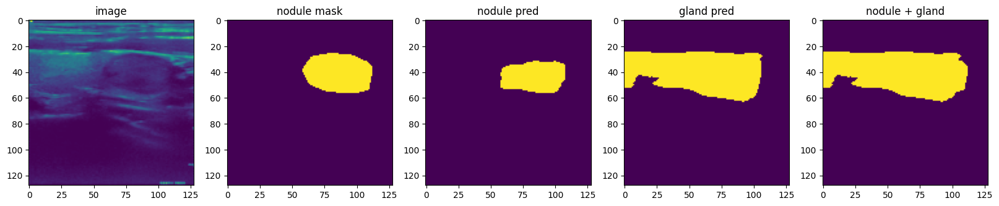

  3%|▎         | 6/229 [00:03<02:08,  1.73it/s]

name :  video_000055_1729840338149.mp4#t=9.6.png


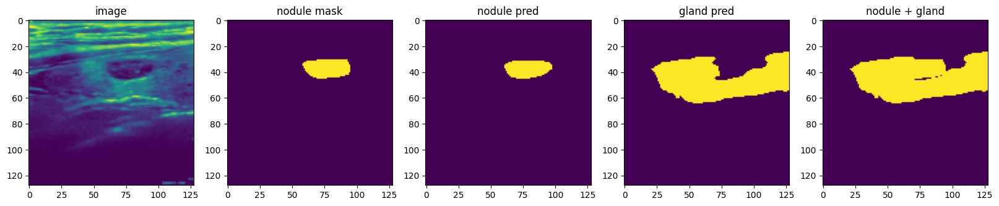

  5%|▌         | 12/229 [00:04<00:53,  4.05it/s]

name :  video_000055_1729840379928.mp4#t=5.666667.png


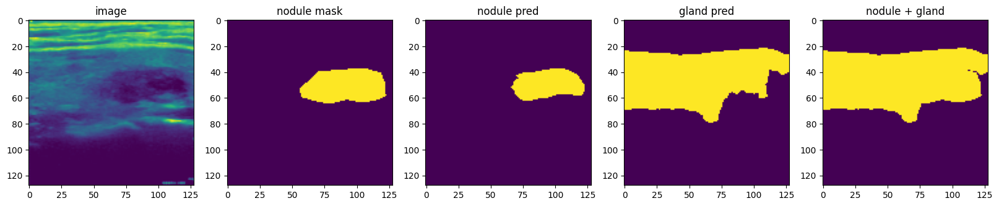

  6%|▌         | 14/229 [00:05<01:05,  3.29it/s]

name :  video_000055_1729840320334.mp4#t=6.866667.png


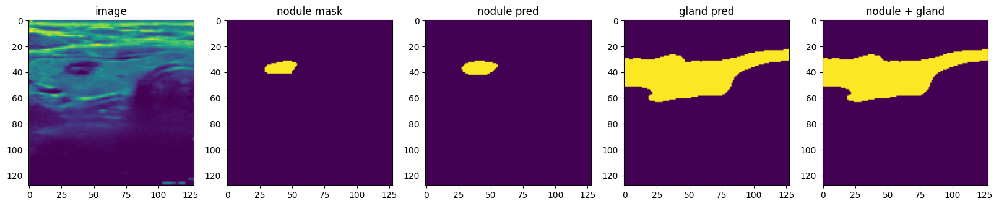

  7%|▋         | 17/229 [00:06<01:07,  3.15it/s]

name :  video_000058_1729844809827.mp4#t=6.466667.png


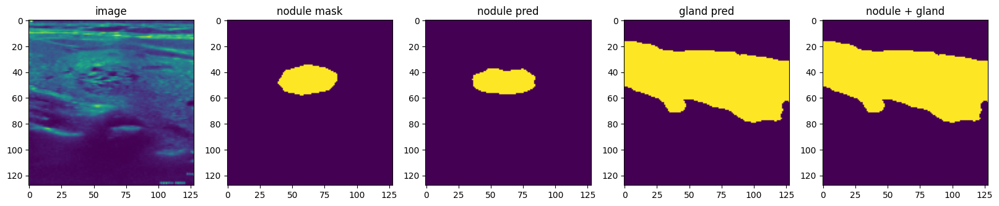

  8%|▊         | 18/229 [00:07<01:26,  2.44it/s]

name :  video_000056_1729842935734.mp4#t=1.2.png


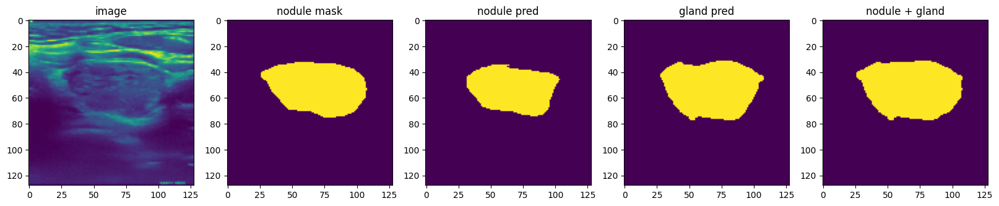

 10%|█         | 24/229 [00:08<00:48,  4.24it/s]

name :  video_000058_1729844828112.mp4#t=8.933333.png


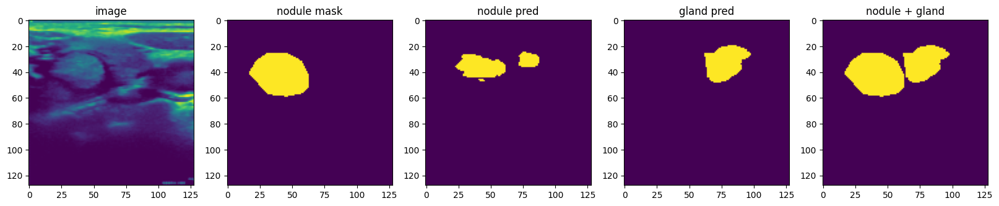

 11%|█▏        | 26/229 [00:09<00:59,  3.42it/s]

name :  video_000056_1729842879528.mp4#t=5.266667.png


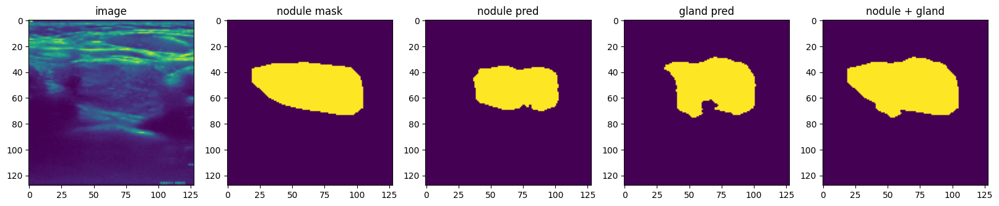

 12%|█▏        | 28/229 [00:10<01:08,  2.95it/s]

name :  video_000056_1729842220863.mp4#t=4.png


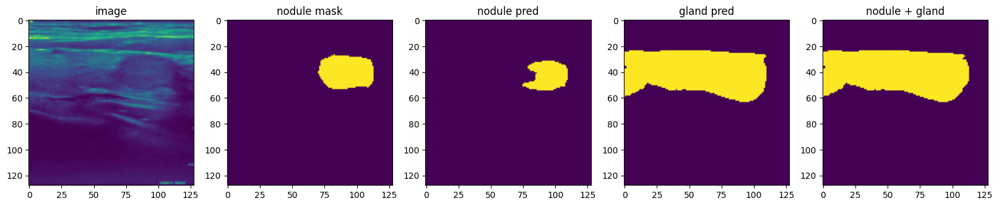

 13%|█▎        | 29/229 [00:11<01:25,  2.33it/s]

name :  video_000056_1729842935734.mp4#t=9.6.png


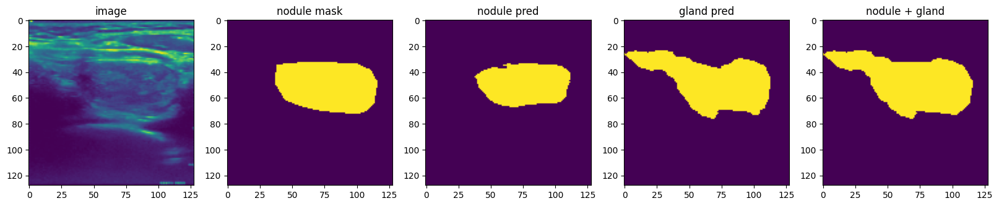

 14%|█▍        | 33/229 [00:12<01:07,  2.91it/s]

name :  video_000058_1729844840454.mp4#t=3.066667.png


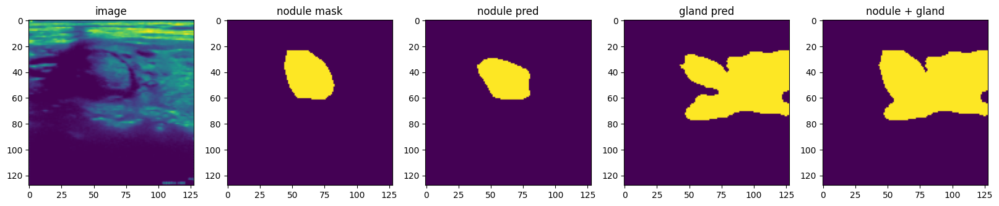

 15%|█▌        | 35/229 [00:12<01:12,  2.69it/s]

name :  video_000058_1729844828112.mp4#t=3.333333.png


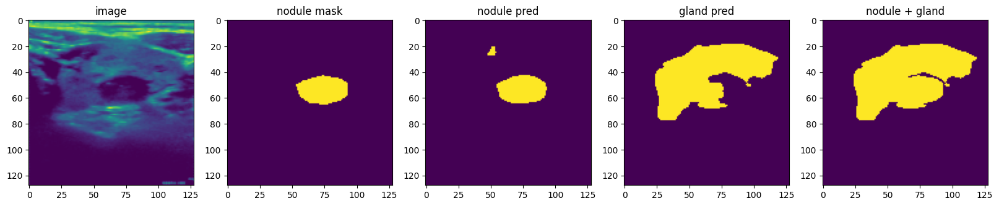

 16%|█▌        | 36/229 [00:13<01:27,  2.19it/s]

name :  video_000055_1729840338149.mp4#t=7.733333.png


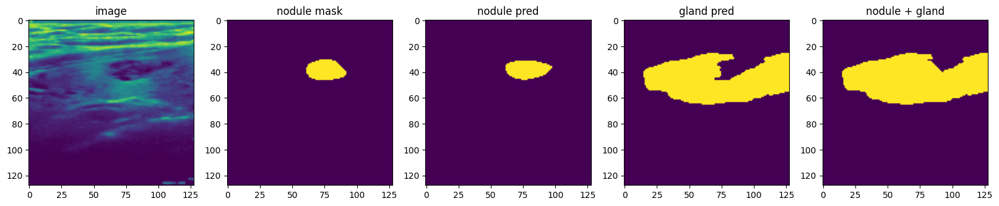

 18%|█▊        | 41/229 [00:15<01:09,  2.70it/s]

name :  video_000055_1729840363438.mp4#t=0.866667.png


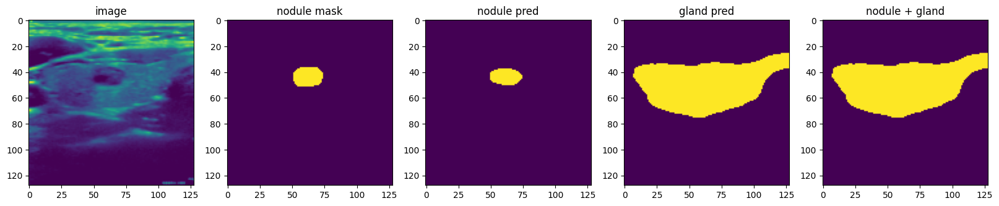

 20%|██        | 46/229 [00:16<00:54,  3.37it/s]

name :  video_000058_1729844840454.mp4#t=5.733333.png


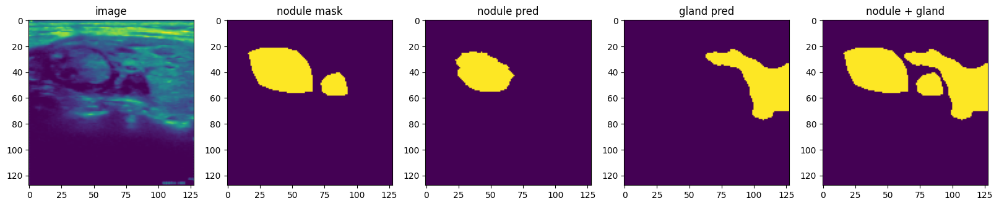

 21%|██        | 48/229 [00:17<00:59,  3.03it/s]

name :  video_000056_1729842914782.mp4#t=2.png


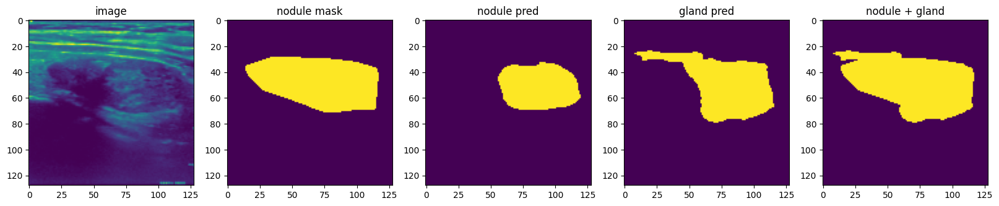

 21%|██▏       | 49/229 [00:18<01:12,  2.49it/s]

name :  video_000055_1729840363438.mp4#t=9.png


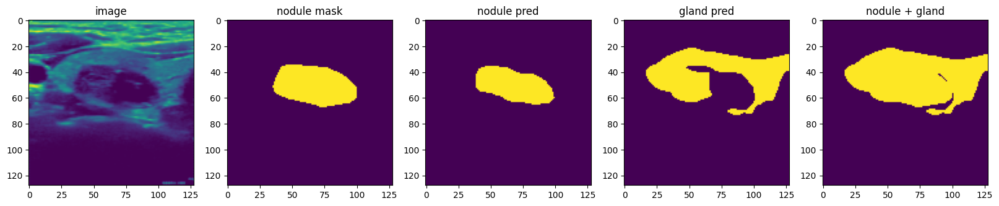

 23%|██▎       | 53/229 [00:19<00:59,  2.96it/s]

name :  video_000055_1729840379928.mp4#t=8.png


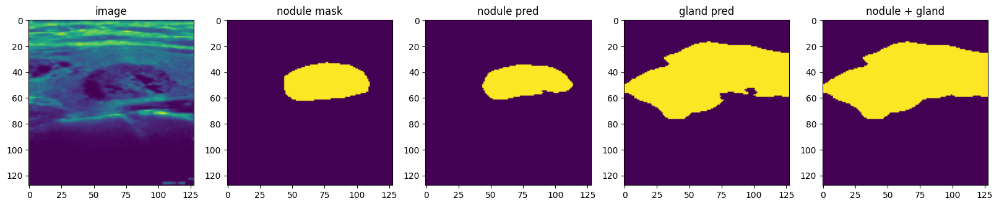

 24%|██▍       | 55/229 [00:19<00:56,  3.09it/s]

name :  video_000055_1729840379928.mp4#t=9.266667.png


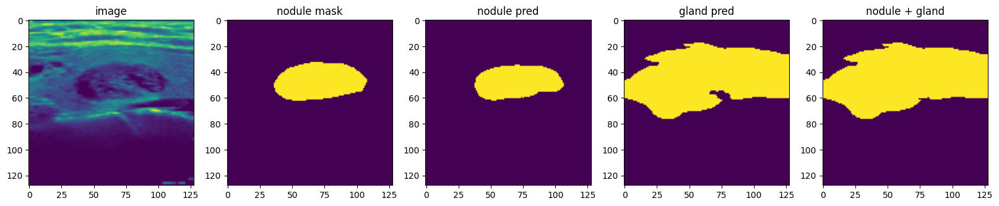

 24%|██▍       | 56/229 [00:20<00:59,  2.89it/s]

name :  video_000056_1729842207113.mp4#t=4.666667.png


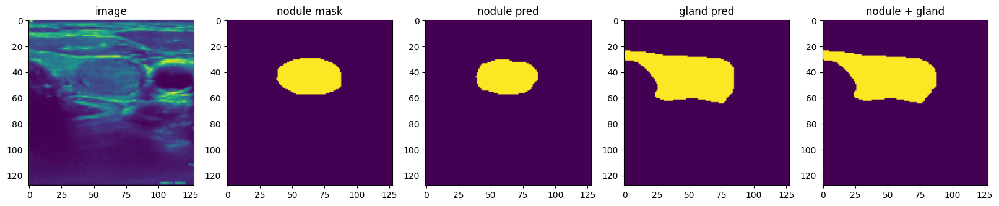

 25%|██▍       | 57/229 [00:21<01:15,  2.28it/s]

name :  video_000056_1729842879528.mp4#t=0.933333.png


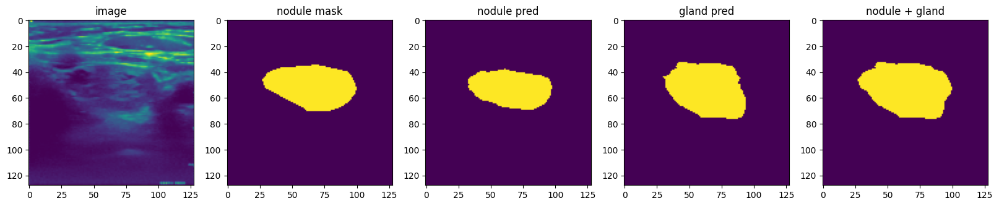

 25%|██▌       | 58/229 [00:21<01:30,  1.89it/s]

name :  video_000056_1729842914782.mp4#t=1.066667.png


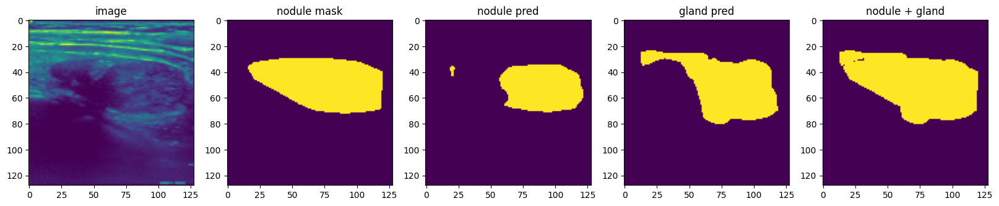

 27%|██▋       | 62/229 [00:22<00:54,  3.09it/s]

name :  video_000056_1729842207113.mp4#t=1.266667.png


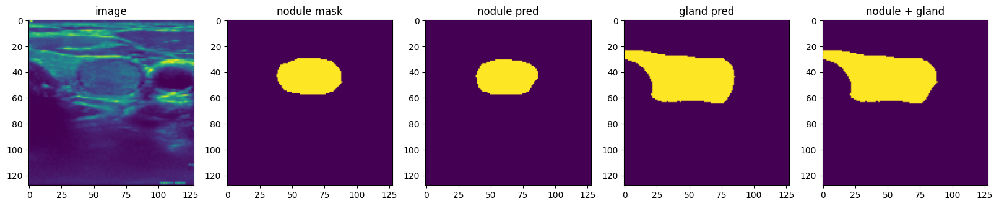

 28%|██▊       | 63/229 [00:23<00:58,  2.84it/s]

name :  video_000055_1729840379928.mp4#t=7.4.png


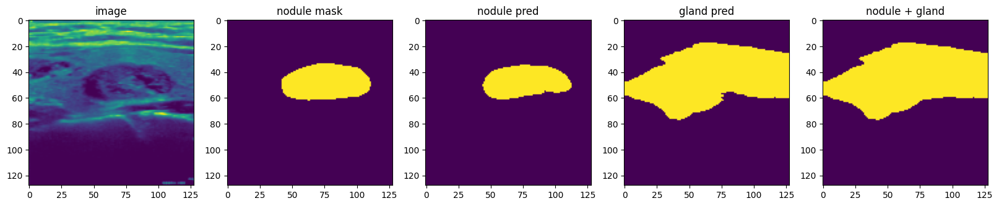

 30%|███       | 69/229 [00:24<00:39,  4.08it/s]

name :  video_000058_1729844840454.mp4#t=6.666667.png


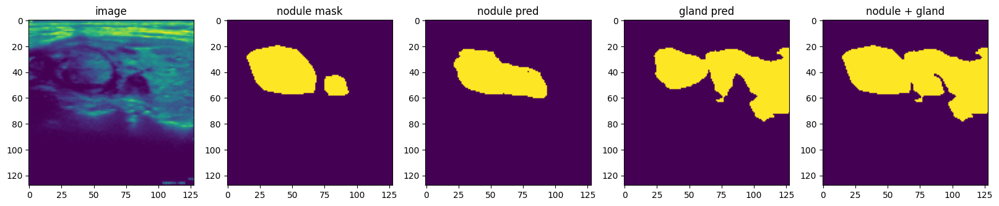

 31%|███       | 71/229 [00:25<00:54,  2.92it/s]

name :  video_000055_1729840363438.mp4#t=9.533333.png


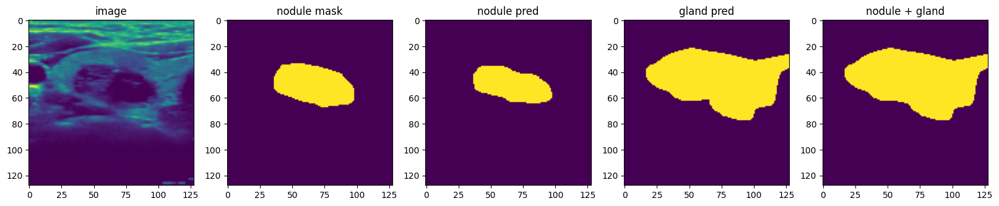

 32%|███▏      | 73/229 [00:26<00:58,  2.66it/s]

name :  video_000056_1729842879528.mp4#t=7.533333.png


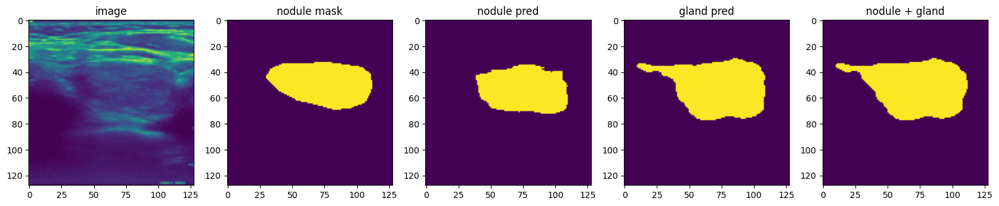

 32%|███▏      | 74/229 [00:27<01:10,  2.19it/s]

name :  video_000055_1729840320334.mp4#t=7.466667.png


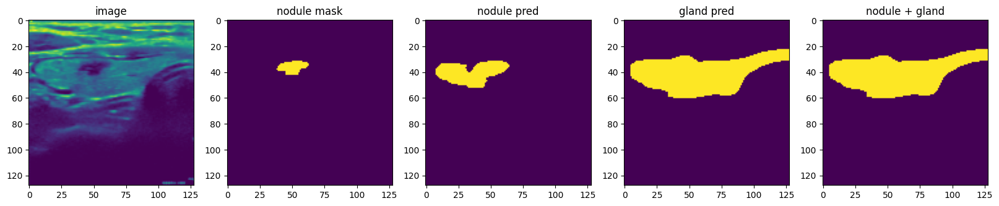

 33%|███▎      | 75/229 [00:28<01:21,  1.88it/s]

name :  video_000055_1729840379928.mp4#t=5.4.png


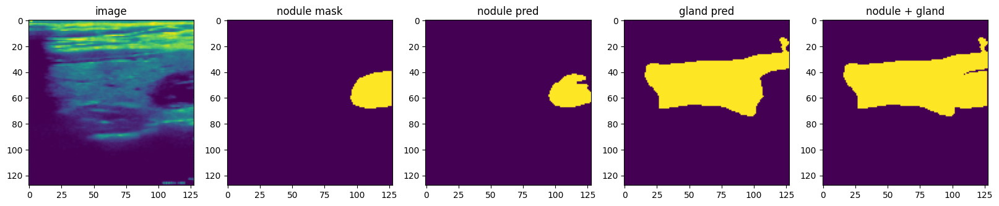

 36%|███▌      | 82/229 [00:29<00:35,  4.13it/s]

name :  video_000055_1729840379928.mp4#t=8.6.png


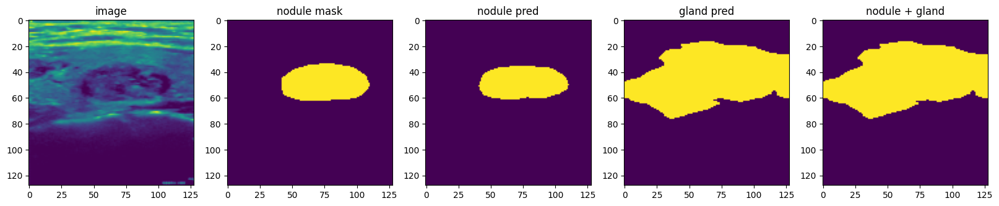

name :  video_000058_1729844840454.mp4#t=4.933333.png


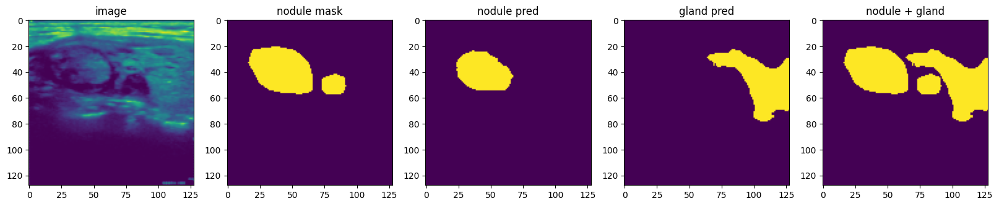

 37%|███▋      | 84/229 [00:31<00:58,  2.49it/s]

name :  video_000055_1729840379928.mp4#t=6.2.png


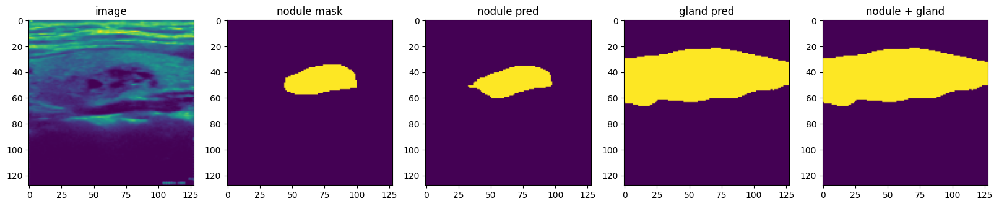

 38%|███▊      | 88/229 [00:32<00:47,  2.98it/s]

name :  video_000056_1729842879528.mp4#t=2.8.png


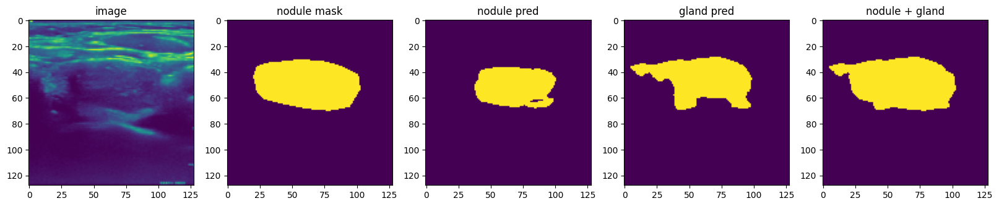

 40%|███▉      | 91/229 [00:32<00:44,  3.08it/s]

name :  video_000055_1729840320334.mp4#t=8.466667.png


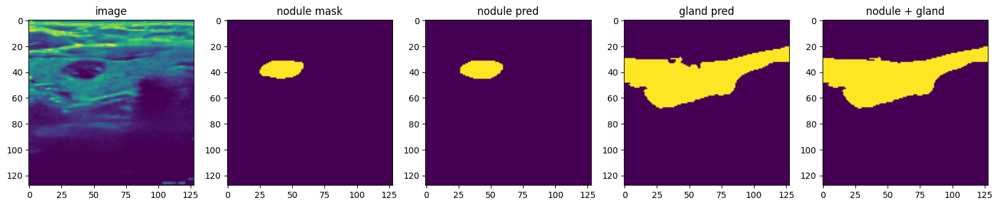

 41%|████      | 94/229 [00:33<00:37,  3.57it/s]

name :  video_000058_1729844797982.mp4#t=7.466667.png


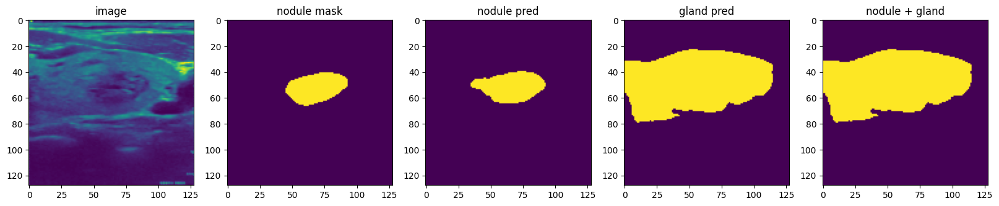

 42%|████▏     | 97/229 [00:34<00:37,  3.56it/s]

name :  video_000058_1729844797982.mp4#t=9.png


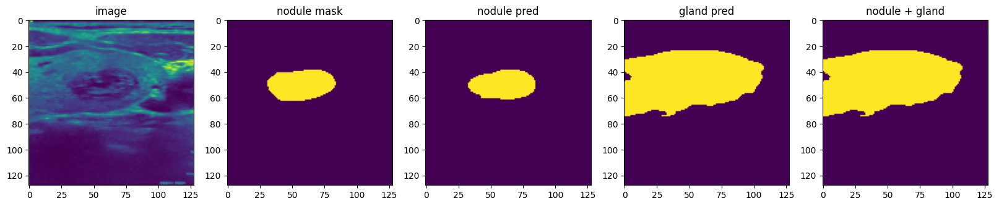

 43%|████▎     | 98/229 [00:35<00:47,  2.76it/s]

name :  video_000058_1729844828112.mp4#t=7.2.png


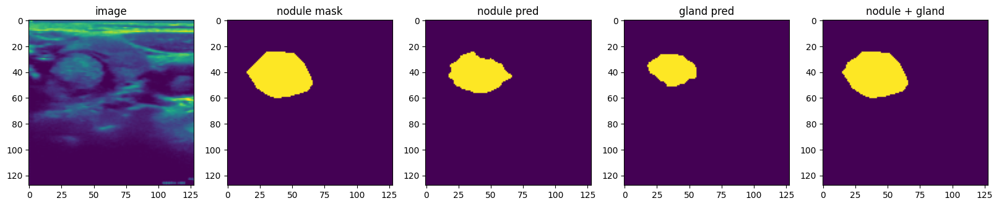

 44%|████▎     | 100/229 [00:35<00:43,  2.95it/s]

name :  video_000058_1729844809827.mp4#t=5.4.png


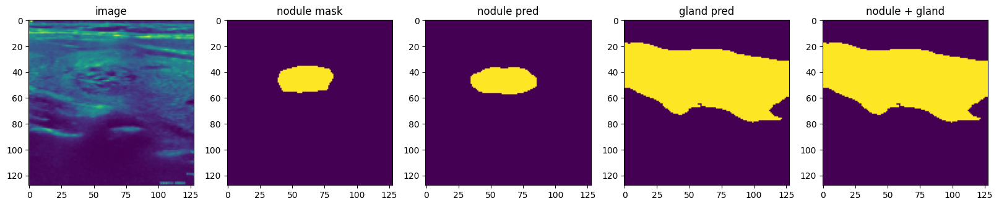

 45%|████▍     | 103/229 [00:37<00:49,  2.54it/s]

name :  video_000058_1729844809827.mp4#t=4.8.png


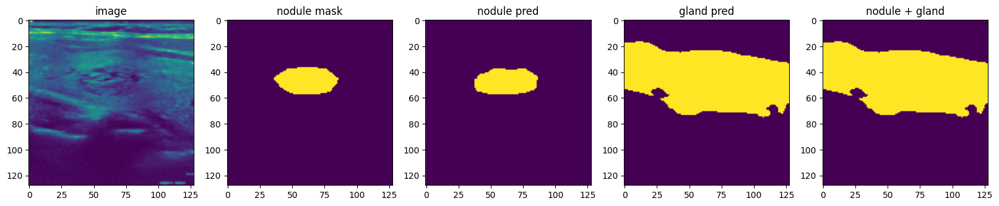

 45%|████▌     | 104/229 [00:38<00:59,  2.11it/s]

name :  video_000056_1729842935734.mp4#t=2.133333.png


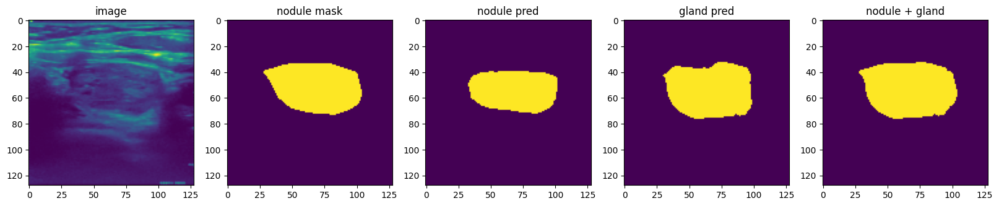

 46%|████▋     | 106/229 [00:39<00:57,  2.14it/s]

name :  video_000055_1729840338149.mp4#t=4.6.png


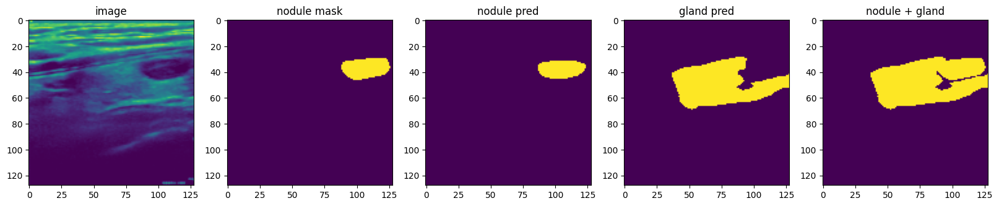

 48%|████▊     | 111/229 [00:39<00:33,  3.50it/s]

name :  video_000058_1729844797982.mp4#t=6.733333.png


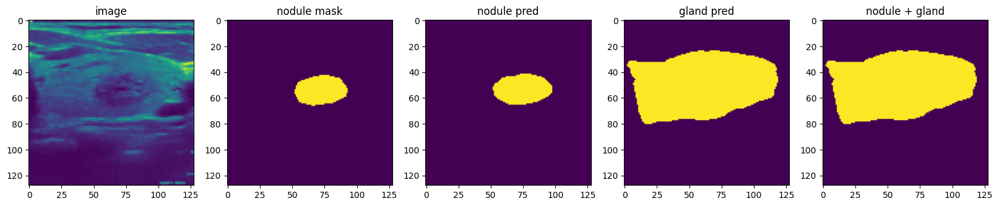

 49%|████▉     | 113/229 [00:40<00:37,  3.06it/s]

name :  video_000058_1729844797982.mp4#t=8.133333.png


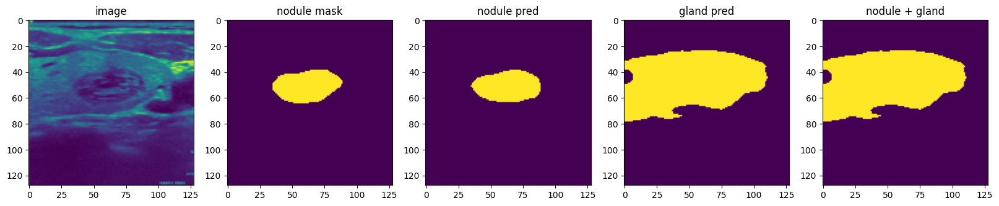

 50%|████▉     | 114/229 [00:41<00:46,  2.46it/s]

name :  video_000058_1729844828112.mp4#t=8.066667.png


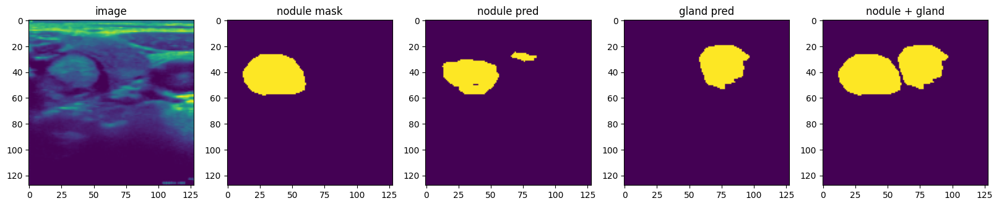

 52%|█████▏    | 120/229 [00:42<00:26,  4.17it/s]

name :  video_000056_1729842935734.mp4#t=3.8.png


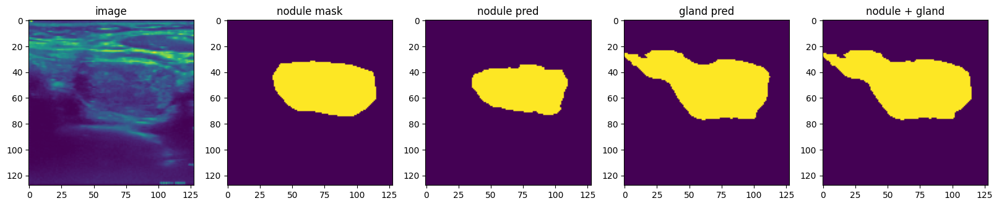

 53%|█████▎    | 122/229 [00:43<00:32,  3.34it/s]

name :  video_000056_1729842879528.mp4#t=6.png


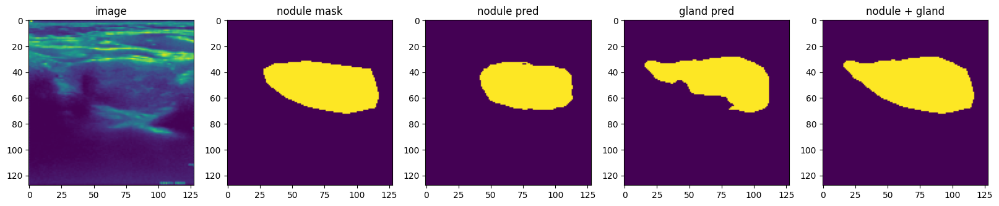

 55%|█████▍    | 125/229 [00:44<00:32,  3.23it/s]

name :  video_000055_1729840320334.mp4#t=0.933333.png


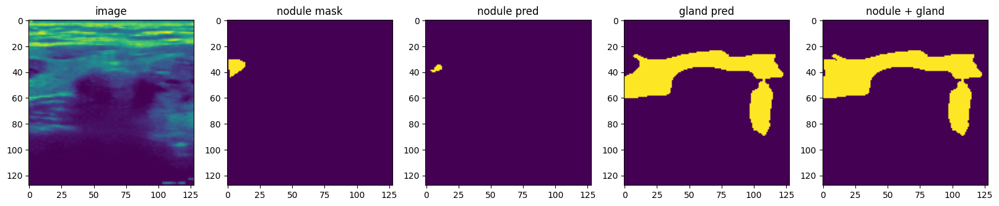

 55%|█████▌    | 127/229 [00:45<00:35,  2.85it/s]

name :  video_000058_1729844809827.mp4#t=6.066667.png


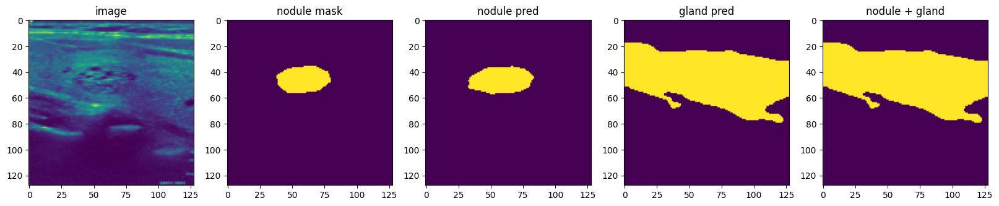

 58%|█████▊    | 132/229 [00:46<00:27,  3.52it/s]

name :  video_000058_1729844828112.mp4#t=4.466667.png


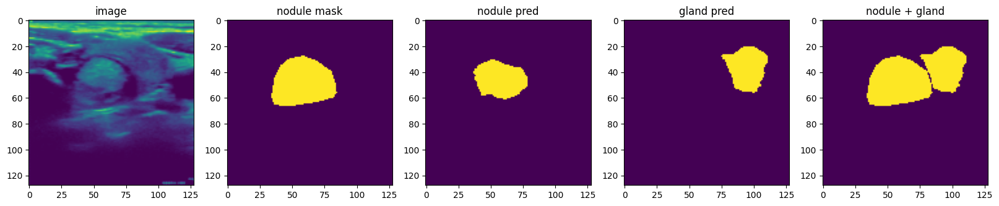

 59%|█████▊    | 134/229 [00:47<00:30,  3.10it/s]

name :  video_000056_1729842914782.mp4#t=5.4.png


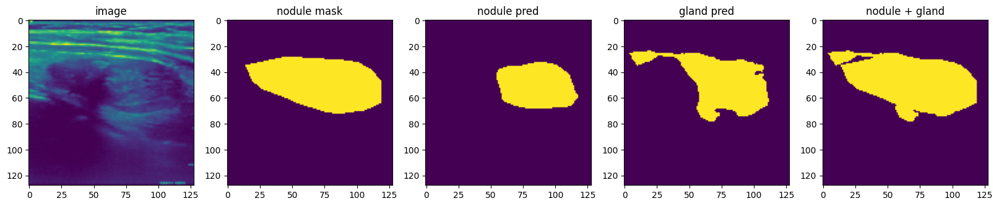

 59%|█████▉    | 136/229 [00:48<00:38,  2.44it/s]

name :  video_000058_1729844840454.mp4#t=4.png


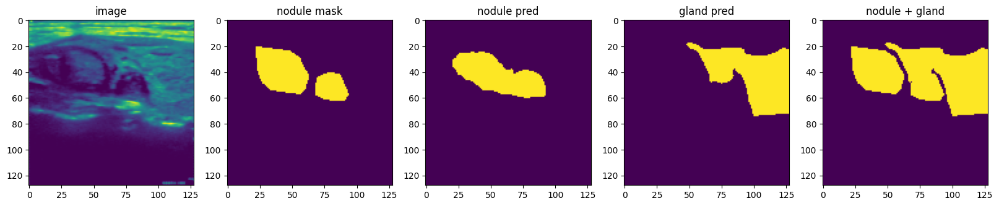

 61%|██████    | 139/229 [00:49<00:34,  2.60it/s]

name :  video_000055_1729840338149.mp4#t=8.333333.png


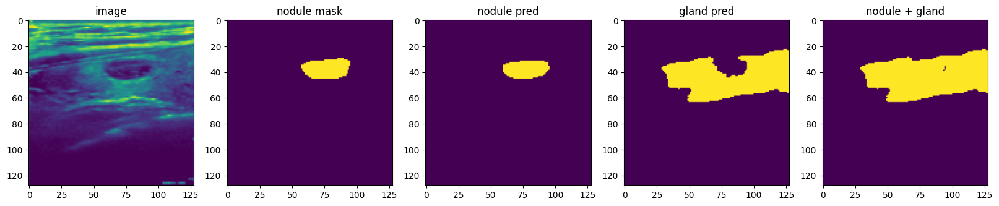

 61%|██████    | 140/229 [00:50<00:40,  2.18it/s]

name :  video_000056_1729842220863.mp4#t=5.533333.png


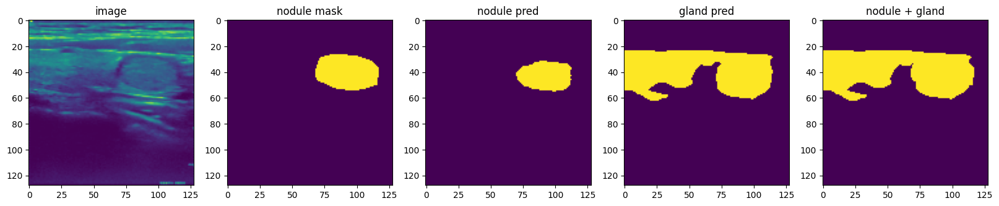

 63%|██████▎   | 145/229 [00:51<00:28,  3.00it/s]

name :  video_000056_1729842914782.mp4#t=4.266667.png


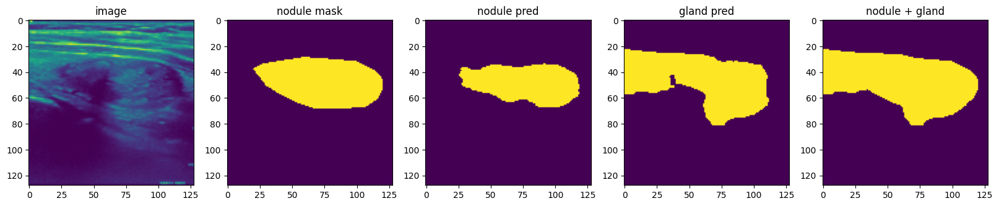

 65%|██████▌   | 149/229 [00:52<00:23,  3.34it/s]

name :  video_000055_1729840363438.mp4#t=4.666667.png


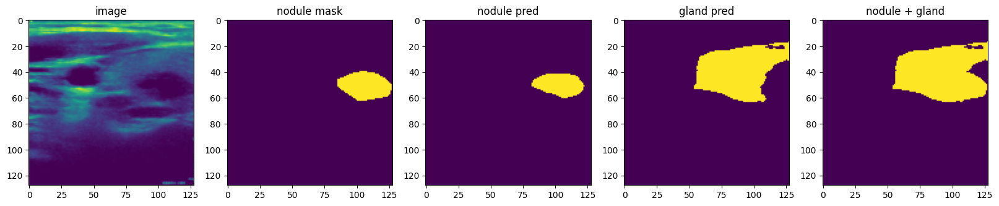

 66%|██████▌   | 150/229 [00:53<00:28,  2.77it/s]

name :  video_000056_1729842207113.mp4#t=1.866667.png


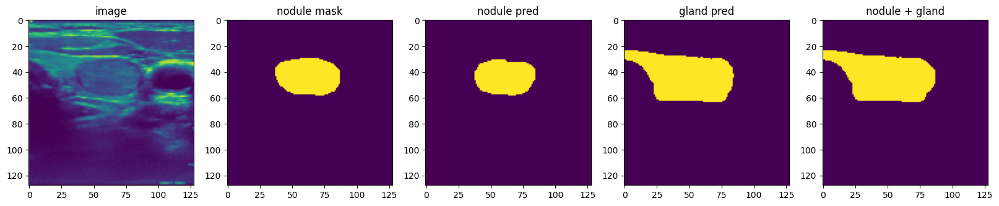

 66%|██████▌   | 151/229 [00:54<00:33,  2.29it/s]

name :  video_000058_1729844828112.mp4#t=2.8.png


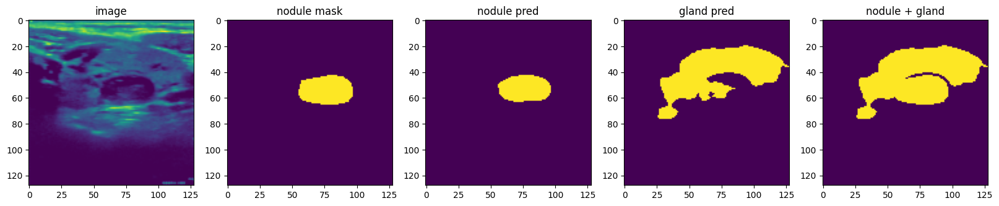

 66%|██████▋   | 152/229 [00:55<00:38,  1.99it/s]

name :  video_000058_1729844828112.mp4#t=5.6.png


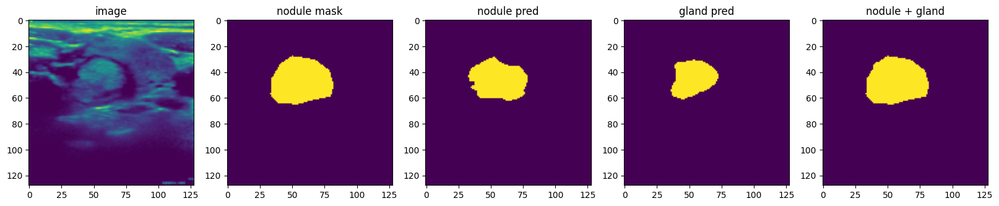

 68%|██████▊   | 156/229 [00:56<00:27,  2.65it/s]

name :  video_000058_1729844797982.mp4#t=9.6.png


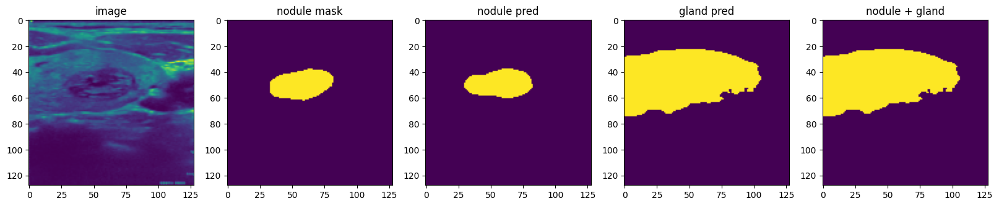

 69%|██████▉   | 158/229 [00:57<00:28,  2.49it/s]

name :  video_000055_1729840363438.mp4#t=8.133333.png


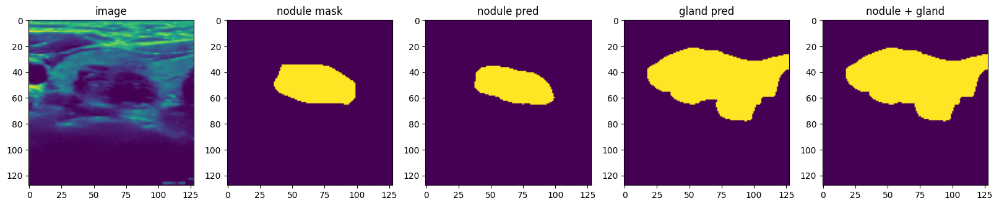

 70%|███████   | 161/229 [00:58<00:25,  2.68it/s]

name :  video_000058_1729844840454.mp4#t=0.133333.png


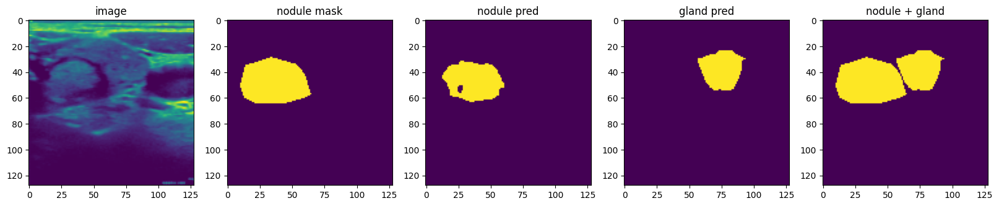

 71%|███████   | 162/229 [00:59<00:30,  2.21it/s]

name :  video_000055_1729840338149.mp4#t=4.333333.png


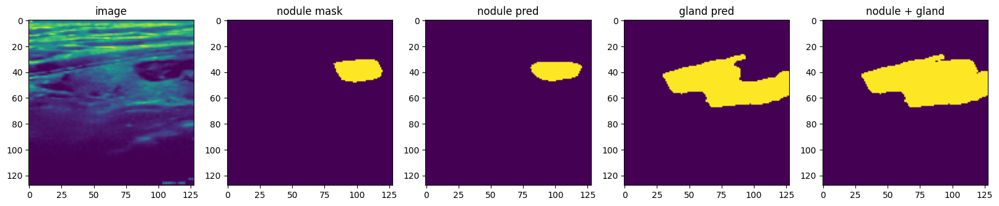

 71%|███████   | 163/229 [01:00<00:35,  1.86it/s]

name :  video_000058_1729844840454.mp4#t=1.6.png


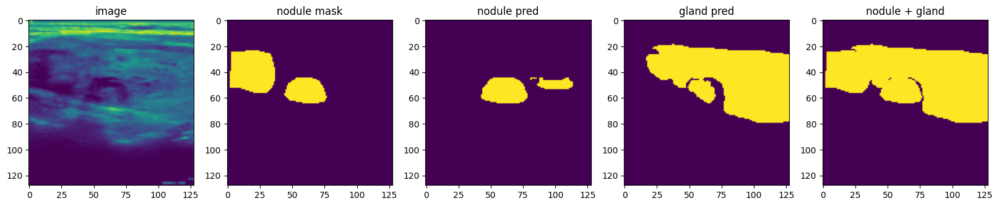

 72%|███████▏  | 164/229 [01:01<00:46,  1.40it/s]

name :  video_000056_1729842935734.mp4#t=6.533333.png


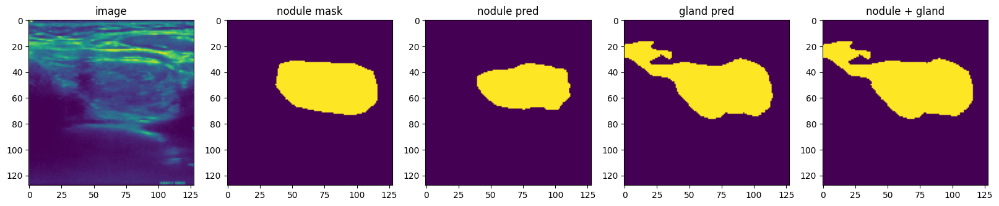

 72%|███████▏  | 165/229 [01:02<00:47,  1.34it/s]

name :  video_000058_1729844828112.mp4#t=9.333333.png


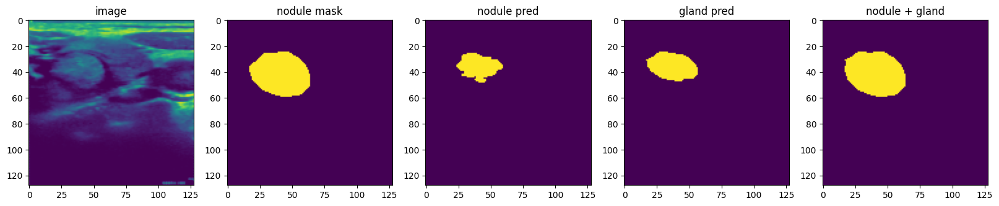

 73%|███████▎  | 167/229 [01:03<00:39,  1.57it/s]

name :  video_000055_1729840379928.mp4#t=6.8.png


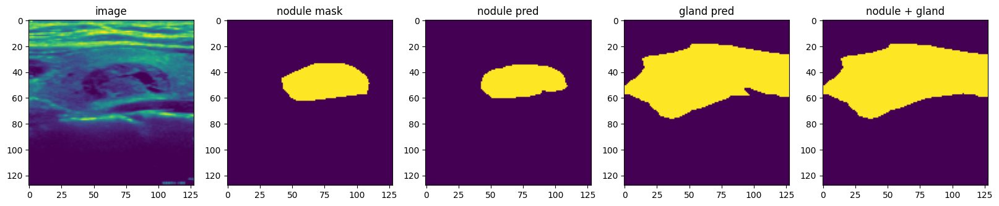

 73%|███████▎  | 168/229 [01:04<00:42,  1.43it/s]

name :  video_000056_1729842207113.mp4#t=0.6.png


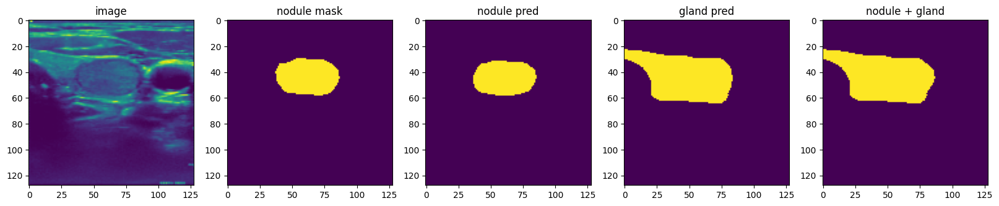

 74%|███████▍  | 170/229 [01:05<00:35,  1.65it/s]

name :  video_000058_1729844840454.mp4#t=2.4.png


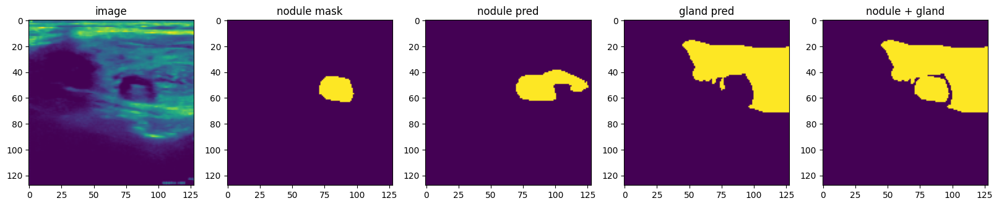

 75%|███████▌  | 172/229 [01:06<00:31,  1.78it/s]

name :  video_000055_1729840338149.mp4#t=9.png


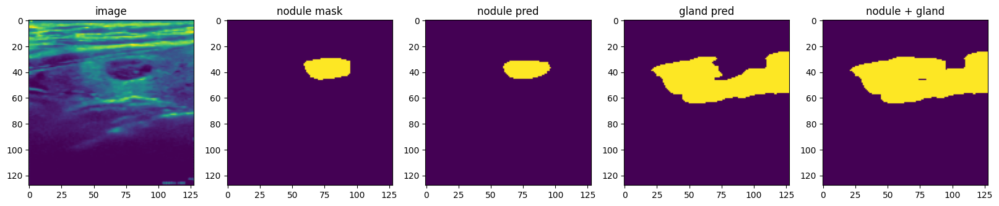

 76%|███████▌  | 173/229 [01:07<00:35,  1.57it/s]

name :  video_000056_1729842207113.mp4#t=6.8.png


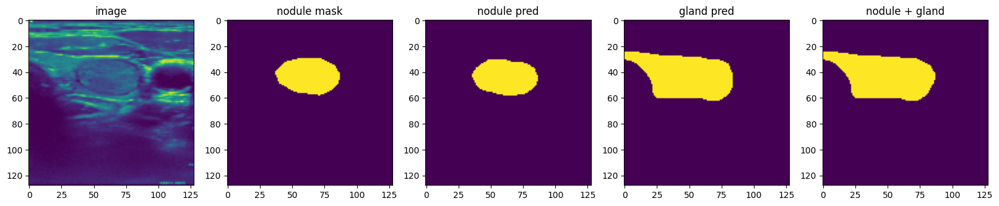

 77%|███████▋  | 176/229 [01:07<00:22,  2.37it/s]

name :  video_000055_1729840363438.mp4#t=2.6.png


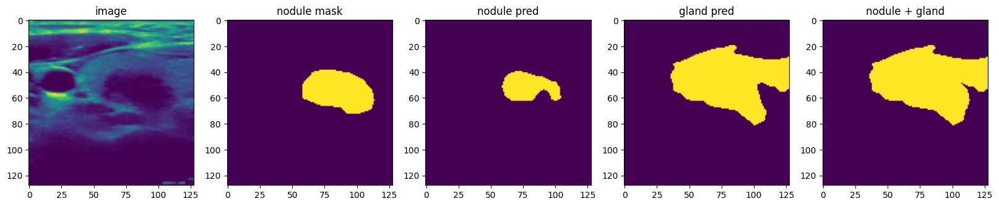

 78%|███████▊  | 179/229 [01:08<00:16,  3.06it/s]

name :  video_000055_1729840320334.mp4#t=9.6.png


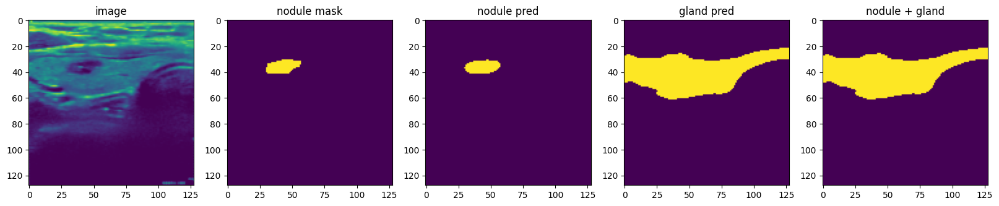

 79%|███████▊  | 180/229 [01:09<00:20,  2.38it/s]

name :  video_000055_1729840320334.mp4#t=5.333333.png


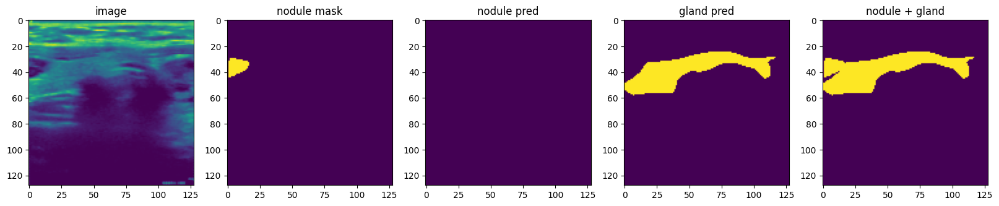

 81%|████████  | 185/229 [01:09<00:11,  3.74it/s]

name :  video_000055_1729840320334.mp4#t=0.333333.png


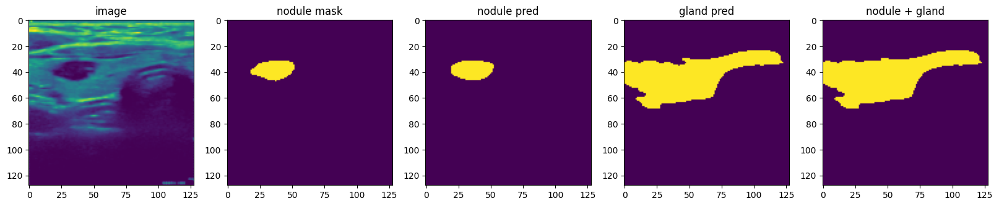

 81%|████████  | 186/229 [01:10<00:15,  2.83it/s]

name :  video_000055_1729840320334.mp4#t=4.933333.png


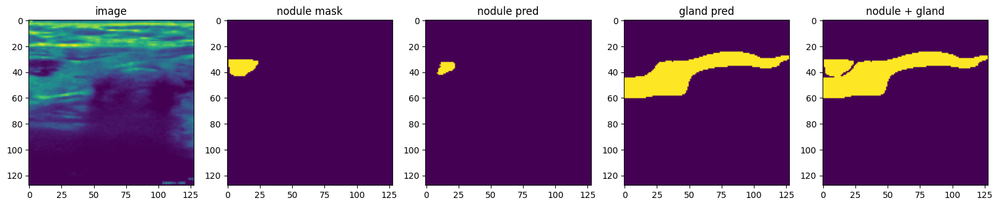

 82%|████████▏ | 188/229 [01:11<00:18,  2.26it/s]

name :  video_000056_1729842220863.mp4#t=1.8.png


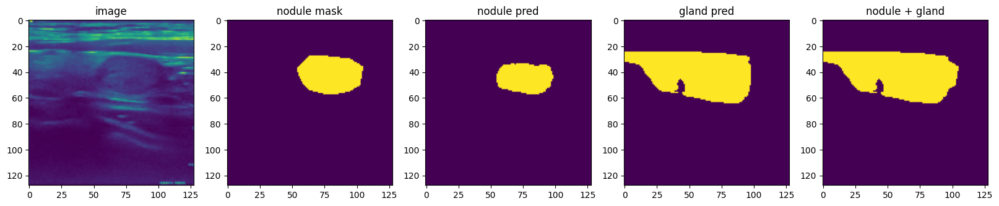

 83%|████████▎ | 189/229 [01:12<00:20,  1.91it/s]

name :  video_000056_1729842207113.mp4#t=5.733333.png


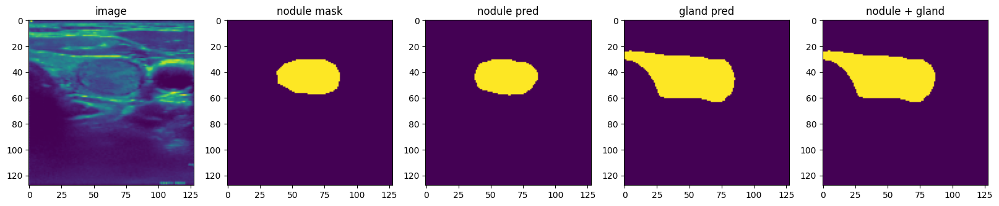

 83%|████████▎ | 190/229 [01:13<00:23,  1.66it/s]

name :  video_000055_1729840363438.mp4#t=7.4.png


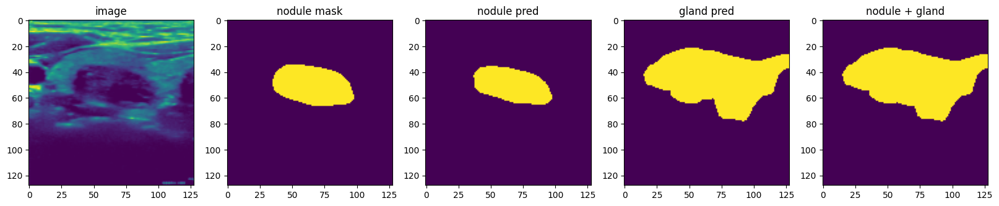

 84%|████████▍ | 192/229 [01:14<00:20,  1.81it/s]

name :  video_000056_1729842935734.mp4#t=5.066667.png


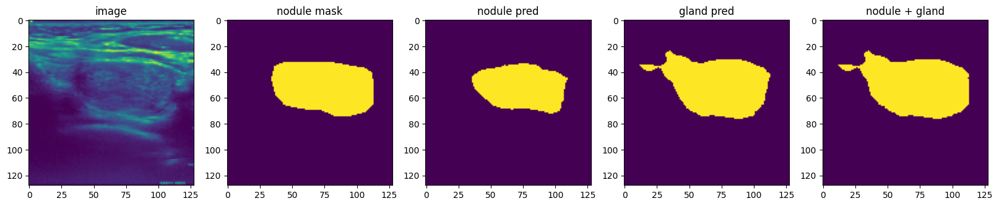

 84%|████████▍ | 193/229 [01:15<00:22,  1.60it/s]

name :  video_000058_1729844797982.mp4#t=6.png


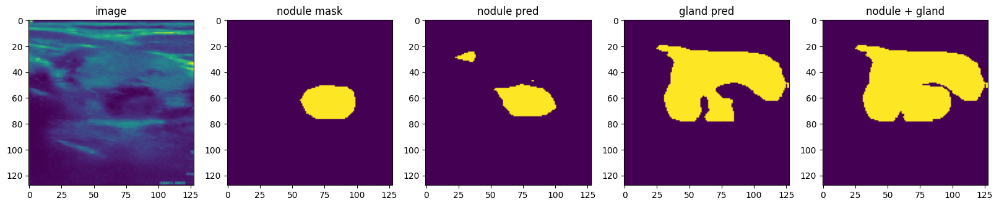

 85%|████████▍ | 194/229 [01:16<00:24,  1.46it/s]

name :  video_000055_1729840363438.mp4#t=1.4.png


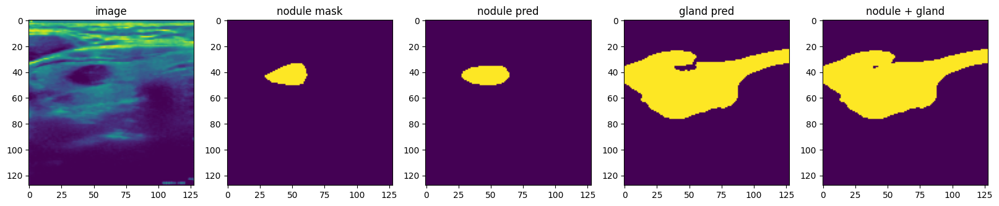

 86%|████████▌ | 196/229 [01:17<00:19,  1.71it/s]

name :  video_000055_1729840320334.mp4#t=9.066667.png


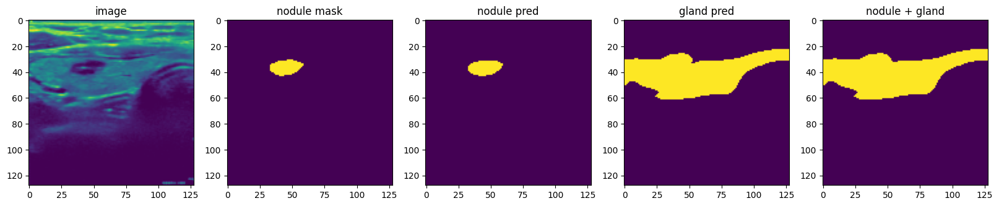

 86%|████████▌ | 197/229 [01:17<00:18,  1.77it/s]

name :  video_000058_1729844828112.mp4#t=6.466667.png


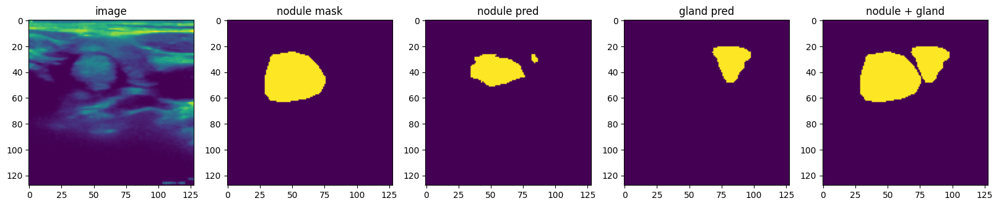

 86%|████████▋ | 198/229 [01:18<00:17,  1.82it/s]

name :  video_000056_1729842914782.mp4#t=8.466667.png


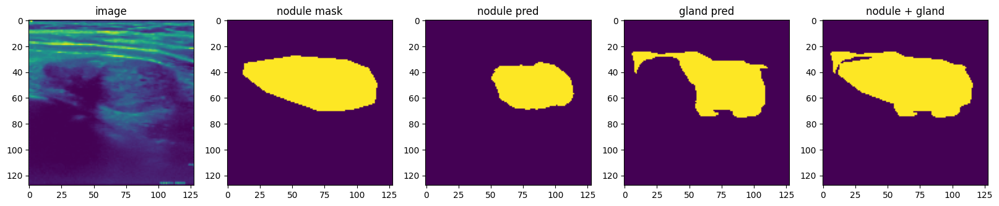

 87%|████████▋ | 200/229 [01:18<00:12,  2.34it/s]

name :  video_000056_1729842220863.mp4#t=9.4.png


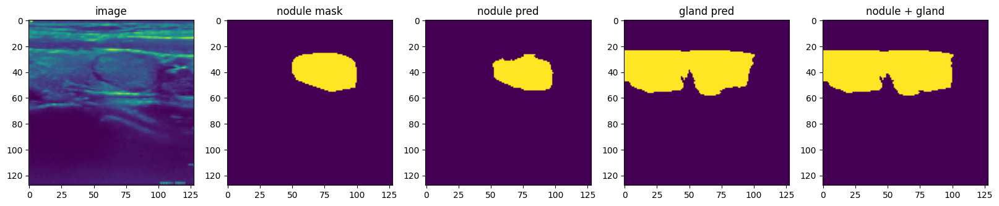

 88%|████████▊ | 201/229 [01:19<00:14,  1.91it/s]

name :  video_000055_1729840363438.mp4#t=6.6.png


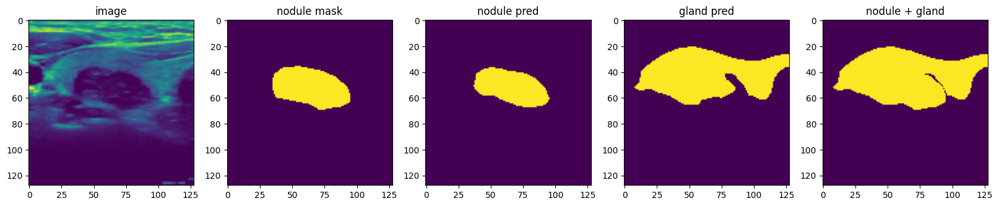

 88%|████████▊ | 202/229 [01:20<00:14,  1.84it/s]

name :  video_000056_1729842220863.mp4#t=7.png


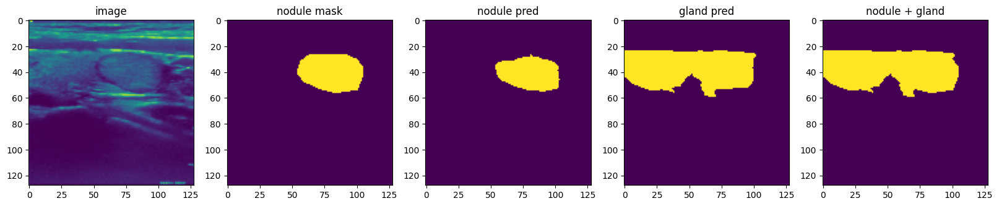

 89%|████████▊ | 203/229 [01:20<00:13,  1.89it/s]

name :  video_000056_1729842207113.mp4#t=3.4.png


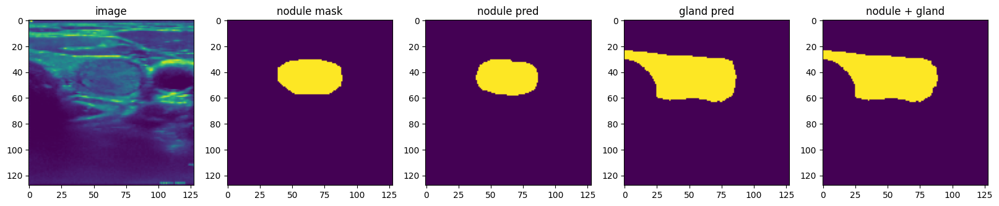

 90%|█████████ | 207/229 [01:21<00:08,  2.69it/s]

name :  video_000056_1729842207113.mp4#t=0.066667.png


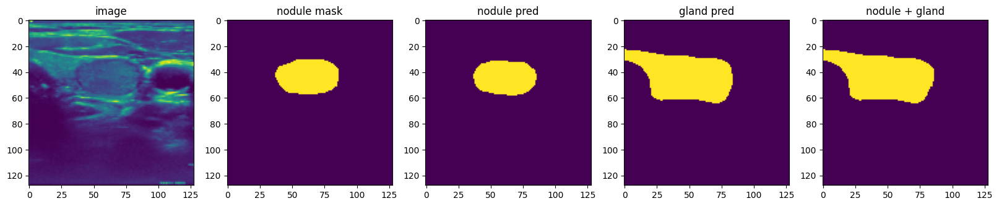

 91%|█████████ | 208/229 [01:22<00:08,  2.56it/s]

name :  video_000055_1729840320334.mp4#t=7.866667.png


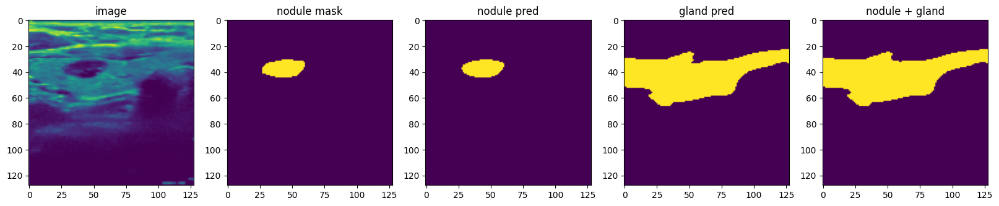

 91%|█████████▏| 209/229 [01:22<00:08,  2.40it/s]

name :  video_000056_1729842220863.mp4#t=8.133333.png


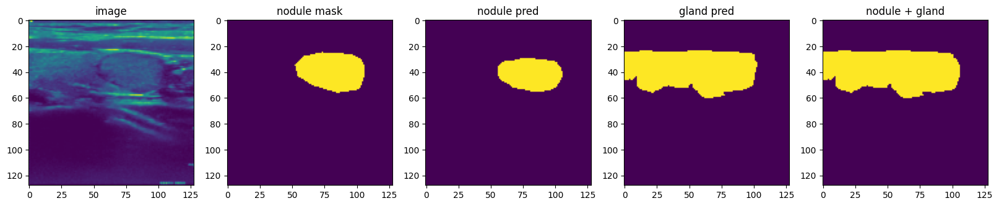

 92%|█████████▏| 210/229 [01:23<00:08,  2.32it/s]

name :  video_000056_1729842935734.mp4#t=0.133333.png


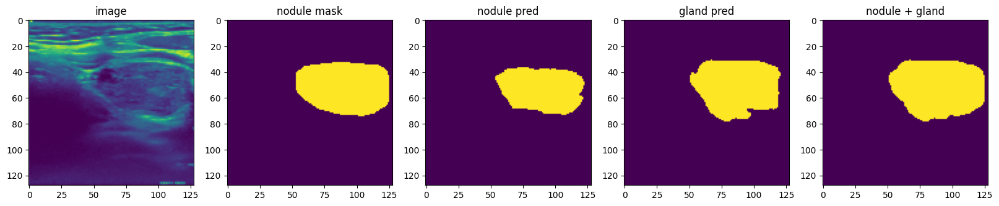

 92%|█████████▏| 211/229 [01:24<00:09,  1.83it/s]

name :  video_000056_1729842879528.mp4#t=8.733333.png


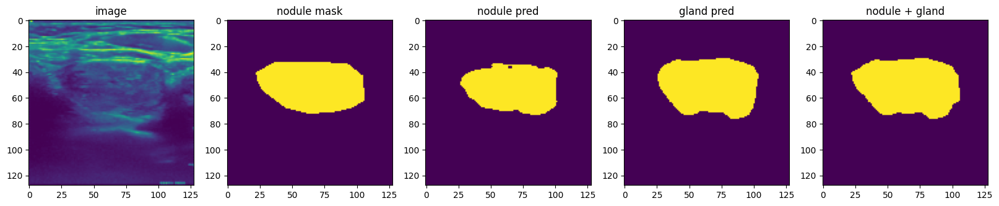

 93%|█████████▎| 213/229 [01:25<00:08,  1.91it/s]

name :  video_000055_1729840379928.mp4#t=9.866667.png


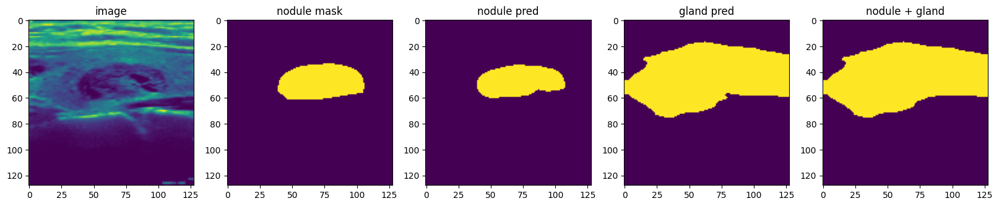

 94%|█████████▍| 216/229 [01:26<00:05,  2.37it/s]

name :  video_000056_1729842879528.mp4#t=0.066667.png


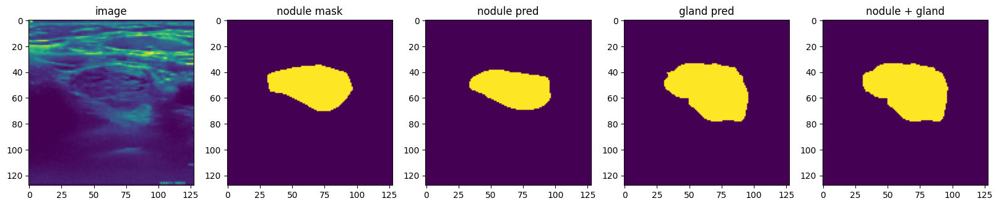

 96%|█████████▌| 219/229 [01:27<00:03,  2.61it/s]

name :  video_000058_1729844809827.mp4#t=0.066667.png


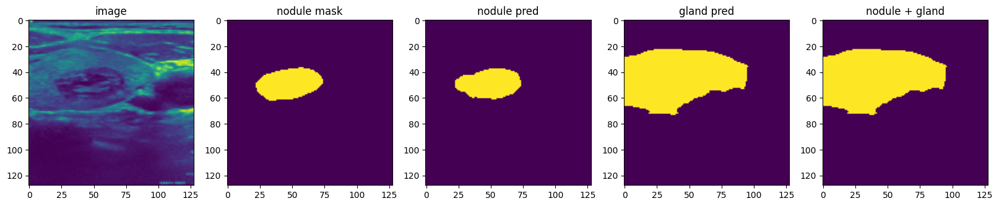

 96%|█████████▌| 220/229 [01:28<00:04,  2.16it/s]

name :  video_000058_1729844797982.mp4#t=6.333333.png


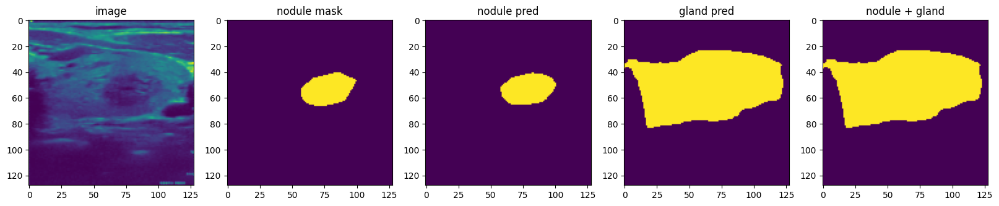

 97%|█████████▋| 223/229 [01:29<00:02,  2.44it/s]

name :  video_000056_1729842879528.mp4#t=9.666667.png


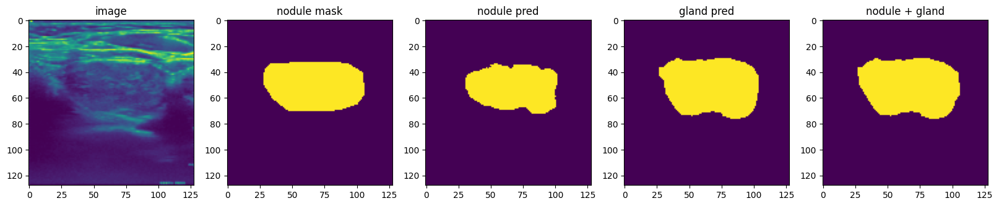

 98%|█████████▊| 224/229 [01:29<00:02,  2.06it/s]

name :  video_000056_1729842935734.mp4#t=8.266667.png


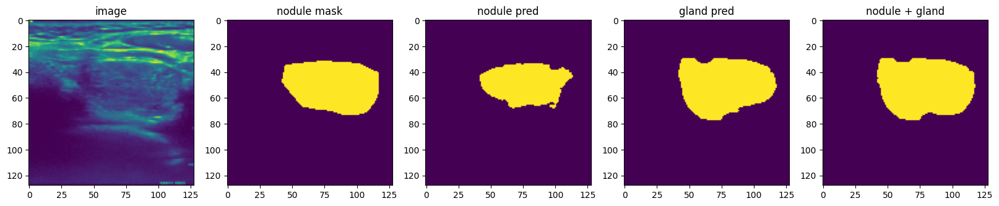

100%|██████████| 229/229 [01:30<00:00,  2.53it/s]


In [74]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
device = "cuda"
model.eval()
model.to(device)
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    # print(torch.unique(image))
    if image != None:
        image = image.to(device)
        outputs = model(image)
        image = image.to("cpu")
        outputs = outputs.to("cpu")
        if from_dataset[0] == 1 and mask_type[0]==1:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.9

            gland_output = postprocess_logits_with_fill(gland_output)
            gland_output = gland_output > 0.5
            mask = mask > 0.5
            
            nodule_gland = (mask[0][0] | gland_output[0][0])
            print("name : ", mask_name[0])
            plt.figure(figsize = (20, 20))
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_gland.detach().numpy())
            plt.title("nodule + gland")
            plt.show()

            nodule_output = nodule_output.squeeze(0).float()
            gland_output = gland_output.squeeze(0).float()

            nodule_output_image = to_pil_image(nodule_output)
            gland_output_image = to_pil_image(gland_output)

            nodule_overlay = overlay(image.squeeze(0), nodule_output)
            gland_overlay = overlay(image.squeeze(0), gland_output)
            
            # plt.figure(figsize = (20, 20))
            # plt.subplot(1,3,1)
            # plt.imshow(image[0][0])
            # plt.title("image")
            # plt.subplot(1,3,2)
            # plt.imshow(nodule_overlay[0])
            # plt.title("nodule overlay")
            # plt.subplot(1,3,3)
            # plt.imshow(gland_overlay[0])
            # plt.title("gland overlay")
            # plt.show()
            nodule_overlay = (nodule_overlay - nodule_overlay.min()) / (nodule_overlay.max() - nodule_overlay.min())
            gland_overlay = (gland_overlay - gland_overlay.min()) / (gland_overlay.max() - gland_overlay.min())
            
            nodule_overlay_image = to_pil_image(nodule_overlay)
            gland_overlay_image = to_pil_image(gland_overlay)

            output_folder = "../ge_data/nodule/from_scratch_inference_masks_test_v2_aug_space(0.9)_weight_decay(1e-5)"
            os.makedirs(output_folder, exist_ok=True)
            os.makedirs(f"{output_folder}/nodule/", exist_ok=True)
            os.makedirs(f"{output_folder}/gland/", exist_ok=True)
            os.makedirs(f"{output_folder}/nodule_overlay/", exist_ok=True)
            os.makedirs(f"{output_folder}/gland_overlay/", exist_ok=True)
            
            # nodule_output_image.save(f"{output_folder}/nodule/{mask_name[0]}")
            # gland_output_image.save(f"{output_folder}/gland/{mask_name[0]}")
            # nodule_overlay_image.save(f"{output_folder}/nodule_overlay/{mask_name[0]}")
            # gland_overlay_image.save(f"{output_folder}/gland_overlay/{mask_name[0]}")
            # break

In [ ]:
nodule_overlay.shape

# visualize ge gland non zero mask

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
device = "cuda"
model.to(device)
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    if image != None:
        image = image.to(device)
        outputs = model(image)
        image = image.to("cpu")
        outputs = outputs.to("cpu")
        if from_dataset[0] == 1 and mask_type[0]==2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = postprocess_logits_with_fill(gland_output)
            print(mask_name[0])
            # plt.subplot(1,4,1)
            # plt.imshow(image[0][0])
            # plt.title("image")
            # plt.subplot(1,4,2)
            # plt.imshow(mask[0][0])
            # plt.title("gland mask")
            # plt.subplot(1,4,3)
            # plt.imshow(nodule_output[0][0].detach().numpy())
            # plt.title("nodule pred")
            # plt.subplot(1,4,4)
            # plt.imshow(gland_output[0][0].detach().numpy())
            # plt.title("gland pred")
            # plt.show()

            nodule_output = nodule_output.squeeze(0).float()
            gland_output = gland_output.squeeze(0).float()

            nodule_output_image = to_pil_image(nodule_output)
            gland_output_image = to_pil_image(gland_output)

            nodule_overlay = overlay(image.squeeze(0), nodule_output)
            gland_overlay = overlay(image.squeeze(0), gland_output)
            
            # plt.figure(figsize = (20, 20))
            # plt.subplot(1,3,1)
            # plt.imshow(image[0][0])
            # plt.title("image")
            # plt.subplot(1,3,2)
            # plt.imshow(nodule_overlay[0])
            # plt.title("nodule overlay")
            # plt.subplot(1,3,3)
            # plt.imshow(gland_overlay[0])
            # plt.title("gland overlay")
            # plt.show()
            nodule_overlay = (nodule_overlay - nodule_overlay.min()) / (nodule_overlay.max() - nodule_overlay.min())
            gland_overlay = (gland_overlay - gland_overlay.min()) / (gland_overlay.max() - gland_overlay.min())
            
            nodule_overlay_image = to_pil_image(nodule_overlay)
            gland_overlay_image = to_pil_image(gland_overlay)

            output_folder = "../ge_data/gland/from_scratch_inference_masks_test_v2_aug_space(0.9)_weight_decay(1e-5)"
            os.makedirs(output_folder, exist_ok=True)
            os.makedirs(f"{output_folder}/nodule/", exist_ok=True)
            os.makedirs(f"{output_folder}/gland/", exist_ok=True)
            os.makedirs(f"{output_folder}/nodule_overlay/", exist_ok=True)
            os.makedirs(f"{output_folder}/gland_overlay/", exist_ok=True)
            
            nodule_output_image.save(f"{output_folder}/nodule/{mask_name[0]}")
            gland_output_image.save(f"{output_folder}/gland/{mask_name[0]}")
            nodule_overlay_image.save(f"{output_folder}/nodule_overlay/{mask_name[0]}")
            gland_overlay_image.save(f"{output_folder}/gland_overlay/{mask_name[0]}")

# visualize benq gland non-zero mask

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 2 and mask_type[0]==2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = postprocess_logits_with_fill(gland_output)

            plt.subplot(1,4,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,4,2)
            plt.imshow(mask[0][0])
            plt.title("gland mask")
            plt.subplot(1,4,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,4,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.show()

# visualize ge nodule zero mask

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = True)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    if torch.sum(mask) == 0:
        outputs = model(image)
        if from_dataset[0] == 1 and mask_type[0]==1:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.9

            gland_output = postprocess_logits_with_fill(gland_output)
            gland_output = gland_output > 0.5
            mask = mask > 0.5
            
            nodule_gland = (mask[0][0] | gland_output[0][0])
            print("name : ", mask_name[0])
            plt.figure(figsize = (20, 20))
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_gland.detach().numpy())
            plt.title("nodule + gland")
            plt.show()

# visualize ge gland zero mask

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = True)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    if torch.sum(mask) == 0:
        outputs = model(image)
        if from_dataset[0] == 1 and mask_type[0] == 2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.9

            gland_output = postprocess_logits_with_fill(gland_output)
            gland_output = gland_output > 0.5
            mask = mask > 0.5
            
            nodule_gland = (mask[0][0] | gland_output[0][0])
            print("name : ", mask_name[0])
            plt.figure(figsize = (20, 20))
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_gland.detach().numpy())
            plt.title("nodule + gland")
            plt.show()

# visualize benq zero mask

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    # if torch.sum(mask) == 0:
    if image!=None:
        outputs = model(image)
        if from_dataset[0] == 2:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]
            
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.9

            gland_output = postprocess_logits_with_fill(gland_output)
            gland_output = gland_output > 0.5
            mask = mask > 0.5
            
            nodule_gland = (mask[0][0] | gland_output[0][0])
            print("name : ", mask_name[0])
            plt.figure(figsize = (20, 20))
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(mask[0][0])
            plt.title("gland mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_gland.detach().numpy())
            plt.title("nodule + gland")
            plt.show()

# visualize nodule post process

In [ ]:
test_dataset = Ge_Benq_Dataset(test_path, transform = test_augmentation, image_size = image_size, training = False, allow_zero_mask = False)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, collate_fn=custom_collate_fn)
model.to("cpu")
for image, mask, from_dataset, mask_type, mask_name in tqdm(test_dataloader):
    if image != None:
        outputs = model(image)
        if from_dataset[0] == 1 and mask_type[0] == 1:
            nodule_output = outputs[:, 0:1, :, :]
            gland_output = outputs[:, 1:2, :, :]

            
            nodule_post_process = postprocess_logits_with_fill(nodule_output)
            nodule_output = torch.sigmoid(nodule_output)
            nodule_output = nodule_output > 0.5

            gland_output = postprocess_logits_with_fill(gland_output)
            
            
            nodule_mask = mask[from_dataset==1]
            plt.figure(figsize=(20, 20))
            plt.subplot(1,5,1)
            plt.imshow(image[0][0])
            plt.title("image")
            plt.subplot(1,5,2)
            plt.imshow(nodule_mask[0][0])
            plt.title("nodule mask")
            plt.subplot(1,5,3)
            plt.imshow(nodule_output[0][0].detach().numpy())
            plt.title("nodule pred")
            plt.subplot(1,5,4)
            plt.imshow(gland_output[0][0].detach().numpy())
            plt.title("gland pred")
            plt.subplot(1,5,5)
            plt.imshow(nodule_post_process[0][0].detach().numpy())
            plt.title("post")
            plt.show()